~~~
Copyright 2025 Google LLC

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

    https://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
~~~

# Quick start with Hugging Face

<table><tbody><tr>
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/google-health/medgemma/blob/main/notebooks/quick_start_with_hugging_face.ipynb">
      <img alt="Google Colab logo" src="https://www.tensorflow.org/images/colab_logo_32px.png" width="32px"><br> Run in Google Colab
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https:%2F%2Fraw.githubusercontent.com%2FGoogle-Health%2Fmedgemma%2Fmain%2Fnotebooks%2Fquick_start_with_hugging_face.ipynb">
      <img alt="Google Cloud Colab Enterprise logo" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" width="32px"><br> Run in Colab Enterprise
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://github.com/google-health/medgemma/blob/main/notebooks/quick_start_with_hugging_face.ipynb">
      <img alt="GitHub logo" src="https://github.githubassets.com/assets/GitHub-Mark-ea2971cee799.png" width="32px"><br> View on GitHub
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://huggingface.co/collections/google/medgemma-release-680aade845f90bec6a3f60c4">
      <img alt="Hugging Face logo" src="https://huggingface.co/front/assets/huggingface_logo-noborder.svg" width="32px"><br> View on Hugging Face
    </a>
  </td>
</tr></tbody></table>

This notebook provides a basic demo of using MedGemma, a collection of Gemma 3 variants that are trained for performance on medical text and image comprehension. MedGemma is intended to accelerate building healthcare-based AI applications.

Learn more about the model at the [HAI-DEF developer site](https://developers.google.com/health-ai-developer-foundations/medgemma).

## Setup

To complete this tutorial, you'll need to have a runtime with [sufficient resources](https://ai.google.dev/gemma/docs/core#sizes) to run the MedGemma model.

You can try out MedGemma 4B for free in Google Colab using a T4 GPU:

1. In the upper-right of the Colab window, select **▾ (Additional connection options)**.
2. Select **Change runtime type**.
3. Under **Hardware accelerator**, select **T4 GPU**.

**Note**: To run the demo with MedGemma 27B in Google Colab, you will need a runtime with an A100 GPU.

### Get access to MedGemma

Before you get started, make sure that you have access to MedGemma models on Hugging Face:

1. If you don't already have a Hugging Face account, you can create one for free by clicking [here](https://huggingface.co/join).
2. Head over to the [MedGemma model page](https://huggingface.co/google/medgemma-1.5-4b-it) and accept the usage conditions.

### Authenticate with Hugging Face

Generate a Hugging Face `read` access token by going to [settings](https://huggingface.co/settings/tokens).

If you are using Google Colab, add your access token to the Colab Secrets manager to securely store it. If not, proceed to run the cell below to authenticate with Hugging Face.

1. Open your Google Colab notebook and click on the 🔑 Secrets tab in the left panel. <img src="https://storage.googleapis.com/generativeai-downloads/images/secrets.jpg" alt="The Secrets tab is found on the left panel." width=50%>
2. Create a new secret with the name `HF_TOKEN`.
3. Copy/paste your token key into the Value input box of `HF_TOKEN`.
4. Toggle the button on the left to allow notebook access to the secret.

In [ ]:
import os
import sys

google_colab = "google.colab" in sys.modules and not os.environ.get("VERTEX_PRODUCT")

if google_colab:
    # Use secret if running in Google Colab
    from google.colab import userdata
    os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
else:
    # Store Hugging Face data under `/content` if running in Colab Enterprise
    if os.environ.get("VERTEX_PRODUCT") == "COLAB_ENTERPRISE":
        os.environ["HF_HOME"] = "/content/hf"
    # Authenticate with Hugging Face
    from huggingface_hub import get_token
    if get_token() is None:
        from huggingface_hub import notebook_login
        notebook_login()

### Install dependencies

In [ ]:
! pip install --upgrade --quiet accelerate bitsandbytes transformers

## Load model from Hugging Face Hub

In [ ]:
from transformers import BitsAndBytesConfig
import torch

model_variant = "medgemma-1.5-4b-it"  # @param ["medgemma-1.5-4b-it", "medgemma-4b-it", "medgemma-27b-it", "medgemma-27b-text-it"]
model_id = f"google/{model_variant}"

# @markdown ---
# @markdown To reduce memory usage, [quantize](https://huggingface.co/docs/transformers/en/quantization/bitsandbytes) the model in 4-bit. **Note:** 4-bit quantization is required to run MedGemma 27B on an A100 GPU in Google Colab. The performance of quantized versions has not been evaluated.
use_quantization = True  # @param {type: "boolean"}

# @markdown ---
# @markdown MedGemma 1.5 4B and MedGemma 27B variants support thinking. If enabled, a system instruction will be added to prompt the model to output its reasoning between two special tokens `<unused94>` and `<unused95>` followed by the final response. **Note:** This notebook shows how to enable thinking for any multimodal or text-only task but it may not benefit some use cases. Thinking may potentially improve results on challenging text-only tasks at the cost of generating more tokens. Thoroughly validate the model's performance and assess the inference time and cost when enabling thinking.
is_thinking = False  # @param {type: "boolean"}
THINKING_VARIANTS = [
    "medgemma-1.5-4b-it",
    "medgemma-27b-it",
    "medgemma-27b-text-it",
]
if is_thinking and model_variant not in THINKING_VARIANTS:
    is_thinking = False
    print(
        "Note: Thinking is enabled for a non-thinking variant. Setting "
        "`is_thinking` to `False`."
    )

# If running a 27B variant in Google Colab, check if the runtime satisfies
# memory requirements
if "27b" in model_variant and google_colab:
    if not ("A100" in torch.cuda.get_device_name(0) and use_quantization):
        raise ValueError(
            "Runtime has insufficient memory to run a 27B variant. "
            "Please select an A100 GPU and use 4-bit quantization."
        )

model_kwargs = dict(
    dtype=torch.bfloat16,
    device_map="auto",
)

if use_quantization:
    model_kwargs["quantization_config"] = BitsAndBytesConfig(load_in_4bit=True)

The following sections contain standalone examples demonstrating how to use the model both directly and with the [`pipeline`](https://huggingface.co/docs/transformers/en/main_classes/pipelines) API. The `pipeline` API provides a simple way to use the model for inference while abstracting away complex details,  while directly using the model gives you complete control over the inference process, including preprocessing and postprocessing. In practice, you should select the method that is best suited for your use case.

Here, you will load the model directly and with the `pipeline` API for use in the next sections. Note that the multimodal variants and the 27B text-only variant are loaded with their respective tasks and classes.

**Load model with the `pipeline` API**

In [ ]:
from transformers import pipeline

if "text" in model_variant:
    pipe = pipeline("text-generation", model=model_id, model_kwargs=model_kwargs)
else:
    pipe = pipeline("image-text-to-text", model=model_id, model_kwargs=model_kwargs)

**Load model directly**

In [64]:
if "text" in model_variant:
    from transformers import AutoModelForCausalLM, AutoTokenizer
    model = AutoModelForCausalLM.from_pretrained(model_id, **model_kwargs)
    tokenizer = AutoTokenizer.from_pretrained(model_id)
else:
    from transformers import AutoModelForImageTextToText, AutoProcessor
    model = AutoModelForImageTextToText.from_pretrained(model_id, **model_kwargs)
    processor = AutoProcessor.from_pretrained(model_id)

Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

## Run inference on images and text

This section demonstrates running inference on image-based tasks using multimodal variants.

**Note:** Proceed to [Run inference on text only](#scrollTo=tcyXG4lTpY4X) if you have selected the 27B text-only variant.

In [ ]:
if "text" in model_variant:
    raise ValueError(
        "You are using a text-only variant which does not support multimodal "
        "inputs. Please proceed to the 'Run inference on text only' section."
    )

**Specify image and text inputs**

In [ ]:
import os
from PIL import Image
from IPython.display import Image as IPImage, display, Markdown

prompt = "Describe this X-ray"  # @param {type: "string"}

# Image attribution: Stillwaterising, CC0, via Wikimedia Commons
image_url = "https://upload.wikimedia.org/wikipedia/commons/c/c8/Chest_Xray_PA_3-8-2010.png"  # @param {type: "string"}
! wget -nc -q {image_url}
image_filename = os.path.basename(image_url)
image = Image.open(image_filename)

**Format conversation**

In [ ]:
role_instruction = "You are an expert radiologist."
if is_thinking:
    system_instruction = f"SYSTEM INSTRUCTION: think silently if needed. {role_instruction}"
    max_new_tokens = 1300
else:
    system_instruction = role_instruction
    max_new_tokens = 300

messages = [
    {
        "role": "system",
        "content": [{"type": "text", "text": system_instruction}]
    },
    {
        "role": "user",
        "content": [
            {"type": "text", "text": prompt},
            {"type": "image", "image": image}
        ]
    }
]

**Run model with the `pipeline` API**

---

**[ User ]**

Describe this X-ray

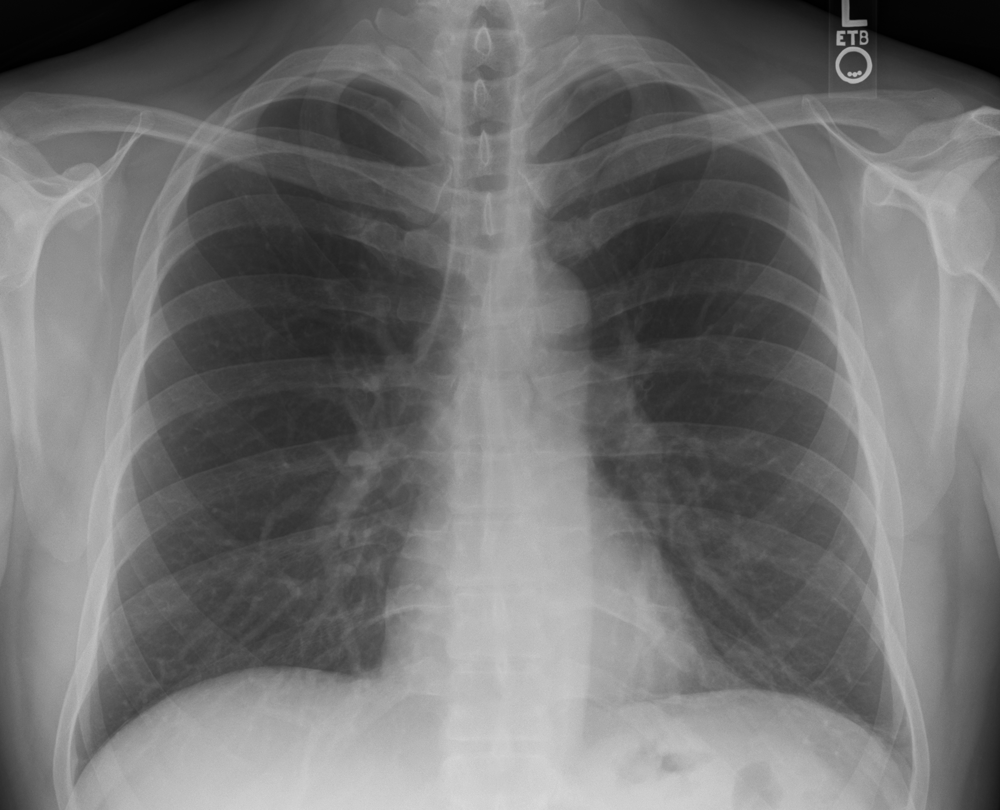

---

**[ MedGemma ]**

Based on the provided image, here's a description of the X-ray:

**Overall Impression:**

The image appears to be a standard PA (posterior-anterior) chest X-ray. The lungs are well-expanded, and there are no obvious signs of acute pathology.

**Specific Findings:**

*   **Heart Size:** The heart size appears within normal limits.
*   **Mediastinum:** The mediastinum (the space between the lungs containing the heart, great vessels, and trachea) appears unremarkable.
*   **Lungs:** The lung fields are clear, with no evidence of consolidation, effusions, or masses.
*   **Bones:** The ribs, clavicles, and spine appear intact.
*   **Soft Tissues:** The soft tissues of the chest wall are unremarkable.

**Conclusion:**

Based on this single image, there are no obvious acute abnormalities. However, a definitive diagnosis cannot be made solely on this X-ray. Further evaluation may be necessary to rule out subtle findings or to assess for underlying conditions.

**Disclaimer:** This is a preliminary interpretation based on a single image. A complete evaluation requires a full clinical history, physical examination, and potentially additional imaging studies.


---

In [ ]:
output = pipe(text=messages, max_new_tokens=max_new_tokens, do_sample=False)
response = output[0]["generated_text"][-1]["content"]

display(Markdown(f"---\n\n**[ User ]**\n\n{prompt}"))
display(IPImage(filename=image_filename, height=300))
if is_thinking:
    thought, response = response.split("<unused95>")
    thought = thought.replace("<unused94>thought\n", "")
    display(Markdown(f"---\n\n**[ MedGemma thinking trace ]**\n\n{thought}"))
display(Markdown(f"---\n\n**[ MedGemma ]**\n\n{response}\n\n---"))

**Run the model directly**

---

**[ User ]**

Describe this X-ray

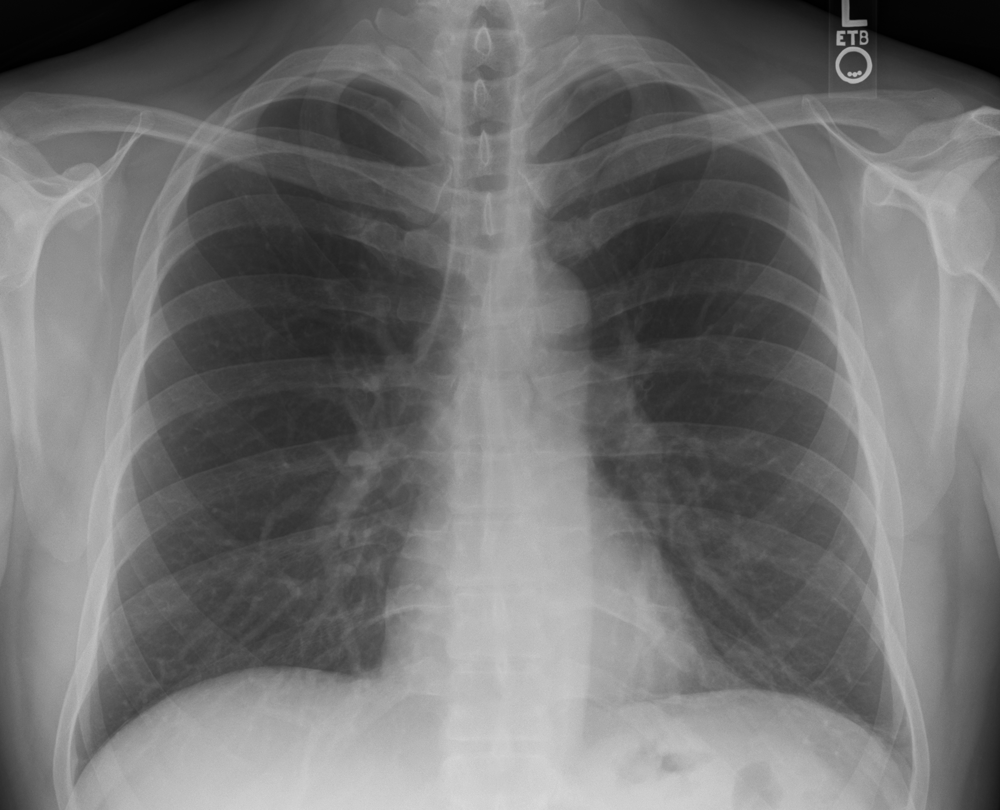

---

**[ MedGemma ]**

Okay, I've reviewed the provided chest X-ray. Here's a description of what I see:

**Overall Impression:**

The X-ray shows a normal adult chest. The lungs appear clear, with no obvious signs of consolidation, effusion, or pneumothorax. The heart size and mediastinal contours are within normal limits.

**Specific Findings:**

*   **Lung Fields:** The lung fields are clear, with no evidence of consolidation, effusion, or pneumothorax.
*   **Heart Size:** The heart size appears normal.
*   **Mediastinum:** The mediastinum is unremarkable.
*   **Ribs:** The ribs appear intact.
*   **Clavicles:** The clavicles appear intact.
*   **Soft Tissues:** The soft tissues of the chest wall are unremarkable.

**In summary, the X-ray is normal.**

**Important Considerations:**

*   This is a single view. A full chest X-ray would include both PA (posterior-anterior) and lateral views for a more comprehensive assessment.
*   The patient's clinical history is crucial for interpreting the X-ray.
*   This interpretation is based solely on the provided image.

**Disclaimer:** This is a preliminary interpretation based on a single image. A definitive diagnosis requires a complete clinical evaluation and potentially additional imaging studies.


---

In [ ]:
inputs = processor.apply_chat_template(
    messages,
    add_generation_prompt=True,
    tokenize=True,
    return_dict=True,
    return_tensors="pt",
).to(model.device, dtype=torch.bfloat16)

input_len = inputs["input_ids"].shape[-1]

with torch.inference_mode():
    generation = model.generate(**inputs, max_new_tokens=max_new_tokens, do_sample=False)
    generation = generation[0][input_len:]

response = processor.decode(generation, skip_special_tokens=True)

display(Markdown(f"---\n\n**[ User ]**\n\n{prompt}"))
display(IPImage(filename=image_filename, height=300))
if is_thinking:
    thought, response = response.split("<unused95>")
    thought = thought.replace("<unused94>thought\n", "")
    display(Markdown(f"---\n\n**[ MedGemma thinking trace ]**\n\n{thought}"))
display(Markdown(f"---\n\n**[ MedGemma ]**\n\n{response}\n\n---"))

## Run inference on text only

This section demonstrates running inference on text-based tasks.

**Specify text prompt and format conversation**

In [45]:
from IPython.display import Markdown

prompt = "I am having a panic attack right now...please help me!!"  # @param {type: "string"}

role_instruction = system_instr = (
        "You are a medical anxiety assistant. Return ONLY a JSON object. "
        "Fields: empathy_statement, distress_level (1-10), clinical_category, followup_question,"
        "intervention_type, intervention_steps (list), safety_escalation (bool)."
        "Try to understand the persons problem through followup questions"
        "intervention steps should not overwhelm the person"
    )
if is_thinking:
    system_instruction = f"SYSTEM INSTRUCTION: think silently if needed. {role_instruction}"
    max_new_tokens = 1500
else:
    system_instruction = role_instruction
    max_new_tokens = 500

messages = [
    {
        "role": "system",
        "content": [{"type": "text", "text": system_instruction}]
    },
    {
        "role": "user",
        "content": [{"type": "text", "text": prompt}]
    }
]

**Run model with the `pipeline` API**

In [ ]:
output = pipe(messages, max_new_tokens=max_new_tokens, do_sample=False)
response = output[0]["generated_text"][-1]["content"]

display(Markdown(f"---\n\n**[ User ]**\n\n{prompt}\n\n---"))
if is_thinking:
    thought, response = response.split("<unused95>")
    thought = thought.replace("<unused94>thought\n", "")
    display(Markdown(f"**[ MedGemma thinking trace ]**\n\n{thought}\n\n---"))
display(Markdown(f"**[ MedGemma ]**\n\n{response}\n\n---"))

---

**[ User ]**

How do you differentiate bacterial from viral pneumonia?

---

**[ MedGemma ]**

Okay, I can explain the key differences between bacterial and viral pneumonia. As a medical assistant, I understand that this is a crucial distinction because the treatment strategies differ significantly. While a definitive diagnosis often requires lab tests, clinical presentation and history can provide strong clues.

Here's a breakdown of how we typically differentiate between the two:

**1. Onset & Symptoms:**

*   **Bacterial Pneumonia:**
    *   **Onset:** Often **sudden and abrupt**. Patients might feel fine one day and acutely ill the next.
    *   **Symptoms:**
        *   High fever (often > 102°F / 39°C).
        *   Shaking chills.
        *   Productive cough: Coughing up thick, often colored (yellow, green, rust-colored) sputum.
        *   Sharp, stabbing pleuritic chest pain (pain that worsens with deep breaths or coughing).
        *   Rapid breathing (tachypnea) and shortness of breath.
        *   Fatigue and malaise.
        *   May experience sweating.
        *   Sometimes confusion (especially in older adults).

*   **Viral Pneumonia:**
    *   **Onset:** Usually **gradual**, often starting with cold-like symptoms that progress over several days.
    *   **Symptoms:**
        *   Lower-grade fever (though it can sometimes be high).
        *   Dry, non-productive cough (hacking cough, may produce small amounts of clear or whitish mucus).
        *   Muscle aches (myalgia) and headache.
        *   Sore throat.
        *   General feeling of being unwell (malaise).
        *   Shortness of breath, but often less severe initially than bacterial.
        *   Chest discomfort may be present but is often less sharp or localized than pleuritic pain.
        *   Wheezing can sometimes occur.

**2. Patient History & Risk Factors:**

*   **Bacterial Pneumonia:**
    *   Often follows a recent upper respiratory infection (like a cold or flu) that worsens or doesn't improve.
    *   More common in individuals with underlying chronic health conditions (COPD, heart disease, diabetes, kidney disease), weakened immune systems (due to illness, medications like steroids, or chemotherapy), smokers, and older adults.
    *   Hospital

---

**Run the model directly**

In [46]:
import re
from pydantic import BaseModel
from typing import List
import json


# 1. Setup Schema
class AnxietyAgentResponse(BaseModel):
    empathy_statement: str
    distress_level: int
    clinical_category: str
    intervention_type: str
    followup_question: str
    intervention_steps: List[str]
    safety_escalation: bool


processor_or_tokenizer = tokenizer if "text" in model_variant else processor

inputs = processor_or_tokenizer.apply_chat_template(
    messages,
    add_generation_prompt=True,
    tokenize=True,
    return_dict=True,
    return_tensors="pt",
).to(model.device)

input_len = inputs["input_ids"].shape[-1]

with torch.inference_mode():
    generation = model.generate(**inputs, max_new_tokens=max_new_tokens, do_sample=False)
    generation = generation[0][input_len:]

response = processor_or_tokenizer.decode(generation, skip_special_tokens=True)


json_match = re.search(r'\{.*\}', response, re.DOTALL)
if json_match:
      try:
          result = AnxietyAgentResponse.model_validate_json(json_match.group()).model_dump()
      except Exception as e:
          result =  {"error": "Validation failed", "raw": json_match.group()}

print(json.dumps(result, indent=2))

# display(Markdown(f"---\n\n**[ User ]**\n\n{prompt}\n\n---"))
# if is_thinking:
#     thought, response = response.split("<unused95>")
#     thought = thought.replace("<unused94>thought\n", "")
#     display(Markdown(f"**[ MedGemma thinking trace ]**\n\n{thought}\n\n---"))
# display(Markdown(f"**[ MedGemma ]**\n\n{response}\n\n---"))

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


{
  "empathy_statement": "I understand you're going through a very difficult and frightening experience right now. Panic attacks can be overwhelming and intense. I'm here to support you.",
  "distress_level": 5,
  "clinical_category": "Panic Attack",
  "intervention_type": "Supportive",
  "followup_question": "Can you tell me a bit more about what you're experiencing right now?",
  "intervention_steps": [
    "Acknowledge the user's distress.",
    "Provide reassurance and validation.",
    "Offer immediate grounding techniques (e.g., focusing on breathing, noticing surroundings).",
    "Encourage the user to focus on the present moment.",
    "Guide the user through a simple breathing exercise (e.g., inhale for 4 seconds, hold for 4 seconds, exhale for 6 seconds).",
    "Remind the user that panic attacks are temporary and will pass.",
    "Encourage the user to speak with a healthcare professional about managing anxiety.",
    "Offer further support if needed."
  ],
  "safety_escalat

In [28]:
print(result['empathy_statement'])

I understand you're going through a difficult time right now. Panic attacks can be incredibly overwhelming and frightening. Please know that you are not alone, and I'm here to support you.


In [36]:
# Install Kokoro and its audio dependencies
!pip install -q kokoro>=0.4.0 soundfile
# Install the phonetic backend (required)
!apt-get -qq -y install espeak-ng > /dev/null 2>&1

In [42]:
from kokoro import KPipeline
from IPython.display import display, Audio
import soundfile as sf
import torch

# 1. Initialize the Kokoro Pipeline ('a' for American English, 'b' for British)
pipeline = KPipeline(lang_code='a')

def speak_response(json_output):
    # Extract the empathy statement from your MedGemma output
    text_to_speak = json_output.get("intervention_steps", "I am here for you.")

    text_to_speak = ' '.join(text_to_speak)

    # 2. Generate audio (af_bella is great for a supportive tone)
    # You can adjust 'speed' to 0.8 to make the voice slower and more calming
    generator = pipeline(text_to_speak, voice='af_bella', speed=0.8)

    for i, (gs, ps, audio) in enumerate(generator):
        # 3. Play the audio directly in Colab
        display(Audio(data=audio, rate=24000, autoplay=True))

        # Optional: Save to file
        sf.write('response_audio.wav', audio, 24000)

# Example usage with your MedGemma result:
# dummy_json = {"empathy_statement": "I hear that you're feeling a bit overwhelmed. Let's take a slow breath together."}
speak_response(result)

In [38]:
speak_response(result)

voices/af_bella.pt:   0%|          | 0.00/523k [00:00<?, ?B/s]

In [48]:
from pydantic import BaseModel
from typing import List, Optional


class EmpathyTurn(BaseModel):
    empathy_statement: str
    opening_question: str


class AssessmentTurn(BaseModel):
    distress_level: int  # 1–10
    clinical_category: str
    reflective_statement: str
    clarifying_question: str


class InterventionTurn(BaseModel):
    intervention_type: str
    intervention_steps: List[str]  # max 3
    followup_question: str


class SafetyTurn(BaseModel):
    safety_escalation: bool
    safety_message: Optional[str]




In [49]:
PROMPTS = {
    "EMPATHY": """
You are a calm, kind mental health care provider.
This is the FIRST turn of a conversation.

Rules:
- Respond with empathy only
- Ask exactly ONE gentle, open-ended question
- Do NOT give advice or coping strategies
- Keep it under 3 sentences
- Output ONLY valid JSON matching the schema
""",

    "ASSESS": """
You are continuing a mental health conversation.

Rules:
- Reflect what the user said
- Estimate distress level from 1 to 10
- Choose a broad clinical category (e.g. anxiety, stress, adjustment)
- Ask exactly ONE clarifying question
- Do NOT give advice yet
- Output ONLY valid JSON matching the schema
""",

    "INTERVENE": """
You are a mental health care provider offering a SMALL next step.

Rules:
- Suggest only ONE intervention
- Provide at most 3 simple steps
- Keep language gentle and optional
- Ask exactly ONE follow-up question
- Output ONLY valid JSON matching the schema
""",

    "SAFETY": """
You are assessing safety.

Rules:
- If there is risk of harm, set safety_escalation = true
- If true, provide a supportive safety message
- Do NOT be alarmist
- Output ONLY valid JSON matching the schema
"""
}

In [50]:
import re
import torch
import json

In [61]:
def generate_json(model, processor, messages, schema, max_new_tokens):
    inputs = processor.apply_chat_template(
        messages,
        add_generation_prompt=True,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
    ).to(model.device)

    input_len = inputs["input_ids"].shape[-1]

    with torch.inference_mode():
        output = model.generate(
            **inputs,
            max_new_tokens=max_new_tokens,
            do_sample=False
        )

    decoded = processor.decode(
        output[0][input_len:], skip_special_tokens=True
    )

    print(decoded)

    match = re.search(r"\{.*\}", decoded, re.DOTALL)
    if not match:
        raise ValueError("No JSON found")

    return schema.model_validate_json(match.group())


In [62]:
def next_state(state, last_response):
    if state == "EMPATHY":
        return "ASSESS"

    if state == "ASSESS":
        if last_response.distress_level >= 7:
            return "SAFETY"
        return "INTERVENE"

    if state == "INTERVENE":
        return "ASSESS"

    if state == "SAFETY":
        return "INTERVENE"


In [63]:
def run_conversation(model, processor):
    messages = []
    state = "EMPATHY"

    SCHEMA = {
        "EMPATHY": EmpathyTurn,
        "ASSESS": AssessmentTurn,
        "INTERVENE": InterventionTurn,
        "SAFETY": SafetyTurn
    }

    TOKEN_LIMIT = {
        "EMPATHY": 60,
        "ASSESS": 120,
        "INTERVENE": 150,
        "SAFETY": 120
    }

    while True:
        system_prompt = PROMPTS[state]

        messages.append({
            "role": "system",
            "content": [{"type": "text", "text": system_prompt}]
        })

        response = generate_json(
            model,
            processor,
            messages,
            SCHEMA[state],
            TOKEN_LIMIT[state]
        )

        print(f"\n[{state}]")
        print(json.dumps(response, indent=2))

        messages.append({
            "role": "assistant",
            "content": [{"type": "text", "text": json.dumps(response, indent=2)}]
        })

        user_input = input("\nUser: ")
        if user_input.lower() in {"exit", "quit"}:
            break

        messages.append({
            "role": "user",
            "content": [{"type": "text", "text": user_input}]
        })

        state = next_state(state, response)


In [60]:



run_conversation(model,processor_or_tokenizer)

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


```python
import math

def solve(n, k):
    """
    Calculates the number of ways to tile a 2^(k-1) x 2^(k-1) board
    with 1x2 dominoes, given that the first row is fixed


ValueError: No JSON found

## Next steps

Explore the other [notebooks](https://github.com/google-health/medgemma/blob/main/notebooks) to learn what else you can do with the model.